# Model Comparison by Product
Comparison done by product. 9 time series one of each product.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
import os
import torch
from tqdm import tqdm

import tensorflow as tf
from darts import TimeSeries
from darts.dataprocessing.transformers import Scaler,MissingValuesFiller,InvertibleMapper,StaticCovariatesTransformer
from darts.dataprocessing import Pipeline
from darts.models import LightGBMModel,TiDEModel,NHiTSModel,TSMixerModel,TFTModel,NBEATSModel

import sklearn
from sklearn.metrics import mean_absolute_percentage_error

#Tensorboard

from pytorch_lightning.loggers import TensorBoardLogger

# Plots
import seaborn as sns
from matplotlib import pyplot as plt
from darts import timeseries as ts
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

# make it not take all memory in the GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
# copy all the data over all GPUs. Important to add the line "with strategy.scope():" and indent when creating and compiling the model
strategy = tf.distribute.MirroredStrategy(
    cross_device_ops=tf.distribute.HierarchicalCopyAllReduce())

2024-06-10 13:23:07.999742: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-10 13:23:07.999781: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-10 13:23:08.001164: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-10 13:23:08.010618: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-10 13:23:09.134910: W tensorflow/compiler/tf2

Imported v0.1.804. After importing autoviz, you must run '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


2024-06-10 13:23:15.937122: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15515 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:04:00.0, compute capability: 6.0
2024-06-10 13:23:15.937702: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 15515 MB memory:  -> device: 1, name: Tesla P100-PCIE-16GB, pci bus id: 0000:05:00.0, compute capability: 6.0
2024-06-10 13:23:15.938225: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 15515 MB memory:  -> device: 2, name: Tesla P100-PCIE-16GB, pci bus id: 0000:07:00.0, compute capability: 6.0


In [2]:
train=pd.read_csv('../DataSet/train_sales_prices.csv',parse_dates=['Date'])
test=pd.read_csv('../DataSet/test_sales_prices.csv',parse_dates=['Date'])
train_test=pd.concat([train,test],axis=0)
train_test

,Date,store,product,number_sold
0,2010-01-01,0,0,801
1,2010-01-02,0,0,810
2,2010-01-03,0,0,818
3,2010-01-04,0,0,796
4,2010-01-05,0,0,808
...,...,...,...,...
25545,2019-12-27,6,9,901
25546,2019-12-28,6,9,926
25547,2019-12-29,6,9,913
25548,2019-12-30,6,9,899


In [3]:
def determine_data(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    outlier_threshold = 3
    
    num_uniques = df.nunique()
    null_values = df.isna()
    min_values = df[numeric_columns].min()
    max_values = df[numeric_columns].max()
    range_values = max_values - min_values
    mean_values = df[numeric_columns].mean()
    std_values = df[numeric_columns].std()        
    zscores = (df[numeric_columns] - mean_values) / std_values

    summary_stats = pd.DataFrame({
            'unique_values': num_uniques == len(df),
            'num_uniques': num_uniques,
            'null_values': null_values.any(),
            'Nan_%':round((df.isna().sum(axis=0)/len(df))*100,2),
            'dtype': df.dtypes,
            'first_row':df.iloc[0],
            'last_row':df.iloc[-1],
            'min': min_values,
            'max': max_values,
            'range': range_values,
            'median': df[numeric_columns].median(),
            'mean': mean_values,
            'std': std_values,
            'num_outliers': np.sum(abs(zscores) > outlier_threshold,axis=0),
            'max_zscore': [np.max(abs(zscores[column])) if column in 
                           numeric_columns else np.nan for column in df.columns]
                          # max_zscores = np.max(abs(zscores)) 
                          # works locally and is cleaner. However, here
                          # it returns a single value instead of a 
                          # series so the above is used.
        }, index=df.columns)
    
    return summary_stats

results=determine_data(train_test)
results

,unique_values,num_uniques,null_values,Nan_%,dtype,first_row,last_row,min,max,range,median,mean,std,num_outliers,max_zscore
Date,False,3652,False,0.0,datetime64[ns],2010-01-01 00:00:00,2019-12-31 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
store,False,7,False,0.0,int64,0,6,0.0,6.0,6.0,3.0,3.000000,2.000004,0.0,1.499997
product,False,10,False,0.0,int64,0,9,0.0,9.0,9.0,4.5,4.500000,2.872287,0.0,1.566696
number_sold,False,936,False,0.0,int64,801,886,234.0,1205.0,971.0,836.0,781.838077,204.910291,0.0,2.673551


    max_rows_analyzed is smaller than dataset shape 255640...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 5)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  3
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  1
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    4 Predictors classified...
        No variables removed since no ID or low-information var

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Unnamed: 0,int64,0.000000,94,2.000000,230089.000000,No issue
Date,object,0.000000,2,,,No issue
store,int64,0.000000,0,0.000000,6.000000,Column has a high correlation with ['Unnamed: 0']. Consider dropping one of them.
product,int64,0.000000,0,0.000000,9.000000,No issue
number_sold,int64,0.000000,0,242.000000,1205.000000,Target column


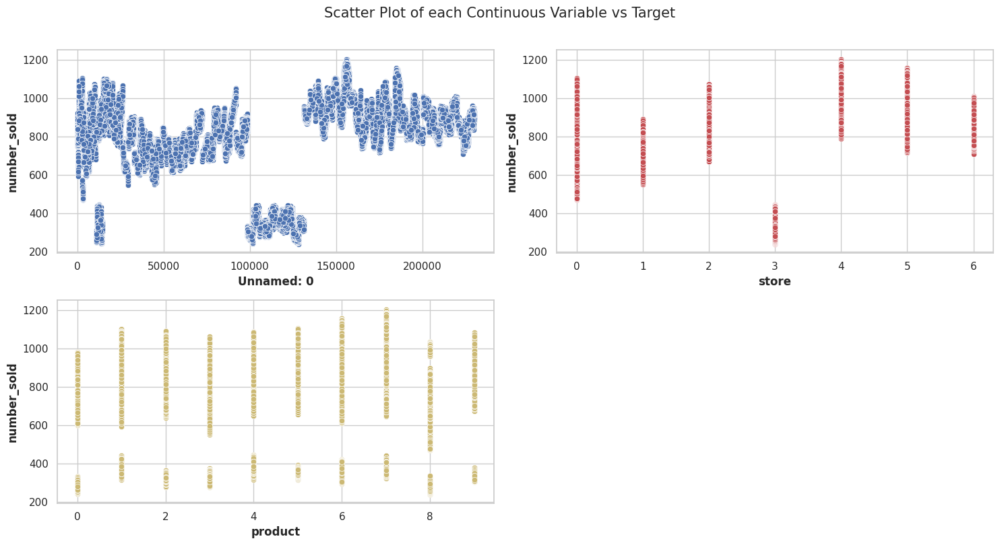

Number of All Scatter Plots = 6


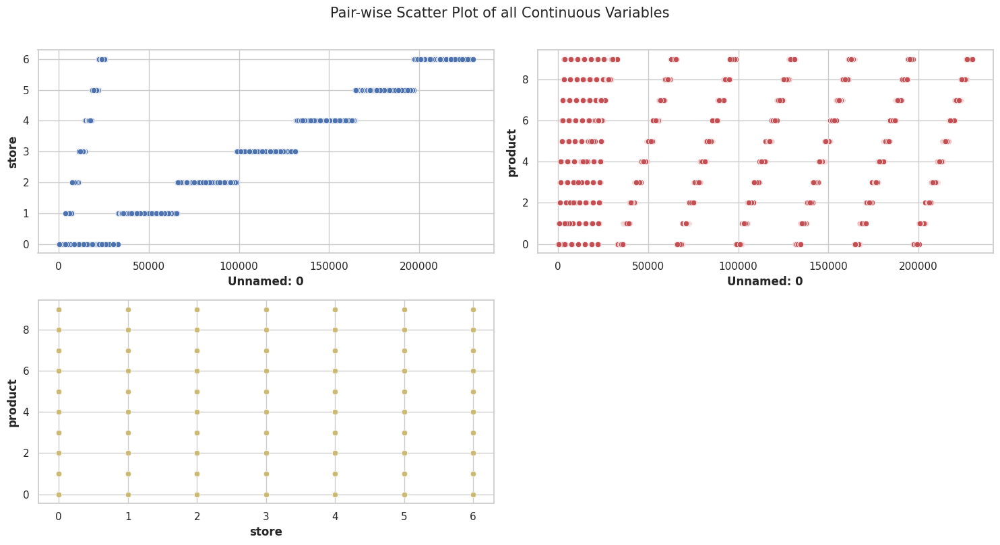

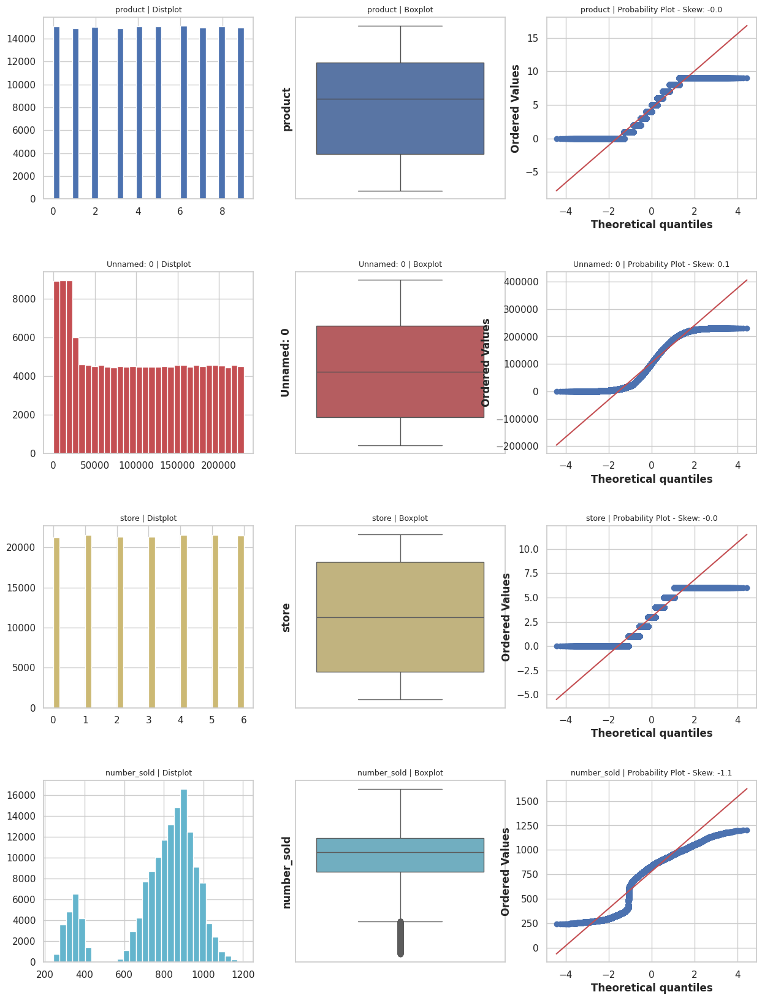

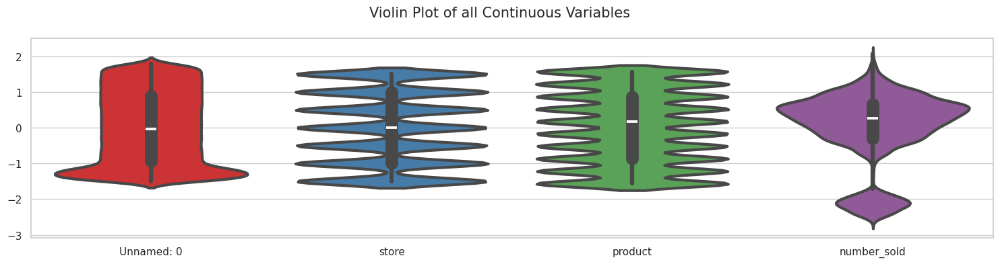

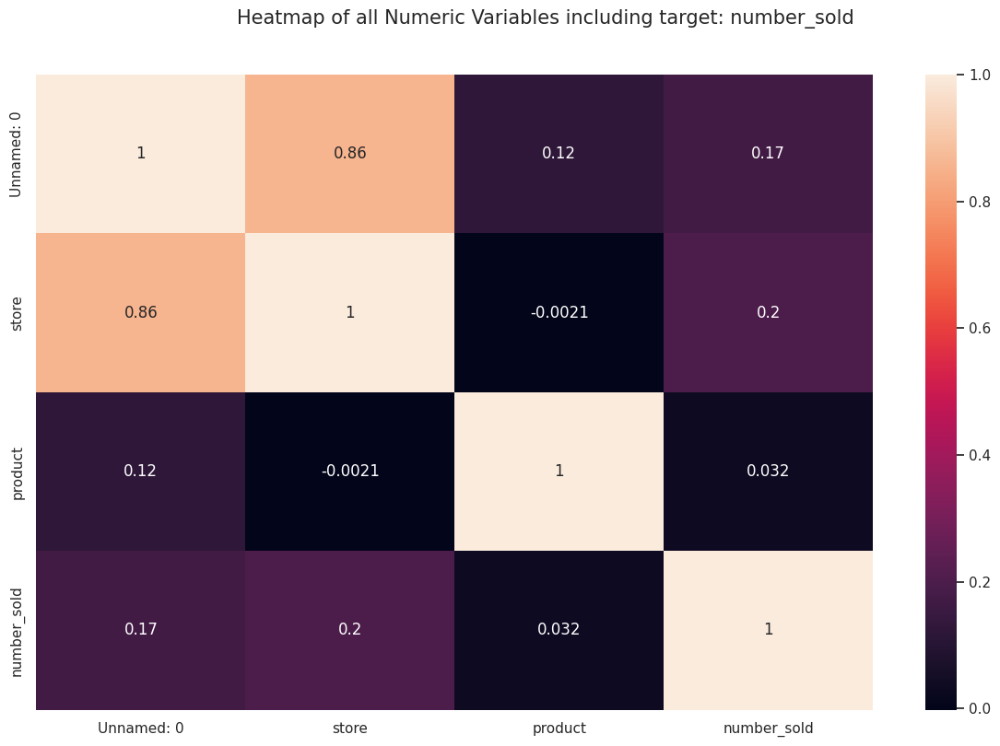

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /home/maarten/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /home/maarten/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /home/maarten/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /home/maarten/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /home/maarten/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /home/maarten/nltk_data...
[nltk_data]    |   Package movie_reviews is already

Could not draw wordcloud plot for Date
All Plots done
Time to run AutoViz = 44 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


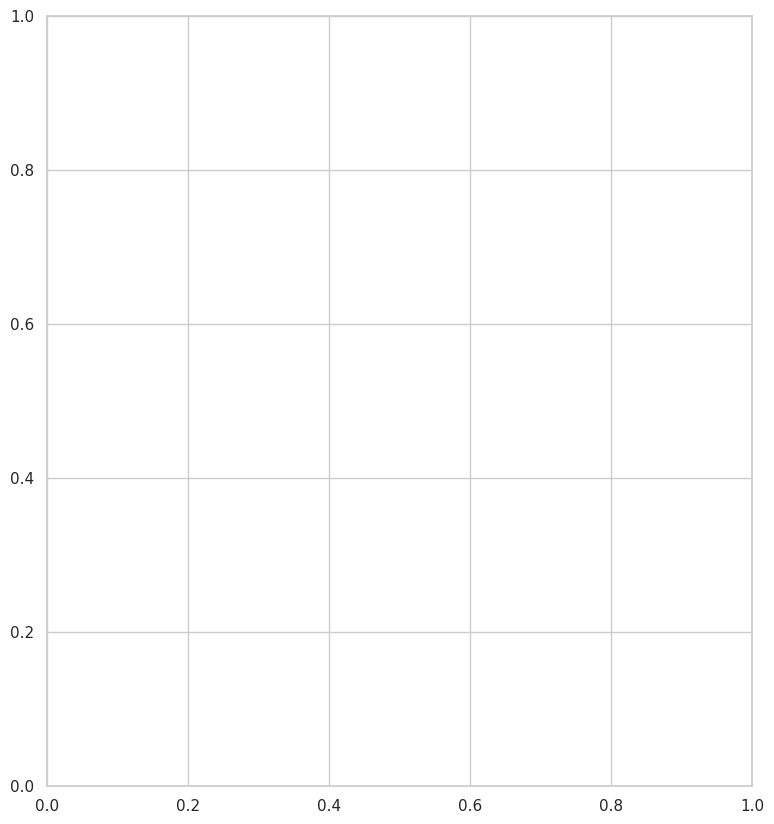

In [4]:
train_test.to_csv('train_test.csv')

AV = AutoViz_Class()
df = AV.AutoViz('train_test.csv',depVar='number_sold')

In [5]:
train_test

,Date,store,product,number_sold
0,2010-01-01,0,0,801
1,2010-01-02,0,0,810
2,2010-01-03,0,0,818
3,2010-01-04,0,0,796
4,2010-01-05,0,0,808
...,...,...,...,...
25545,2019-12-27,6,9,901
25546,2019-12-28,6,9,926
25547,2019-12-29,6,9,913
25548,2019-12-30,6,9,899


In [6]:
train_test.set_index('Date',drop=True,inplace=True)
train_test['year']=train_test.index.year
train_test['Month']=train_test.index.month

In [7]:
train_test.tail()

,store,product,number_sold,year,Month
Date,,,,,
2019-12-27,6,9,901,2019,12
2019-12-28,6,9,926,2019,12
2019-12-29,6,9,913,2019,12
2019-12-30,6,9,899,2019,12
2019-12-31,6,9,886,2019,12


# Visualizing Data
I plot two types of graphs: Distribution overtime for the total sales and quantity of item sold per year and Month.
* Total sales distribution overtime:
    If I compare the distribution ot the average sales overtime,then the conclusion is thatthe data has a uniform  distribution, not outliers or skeness for the total sales overtime.So, I can check the skeness of the total sales distribution and follow a normal distribution. 
* Quantity of item sold per year/Month:
    Every year follows the same distribution (not a real case but allow us to focus on the model comparison instead of the data). We can see that the time series has seasonality and trend.

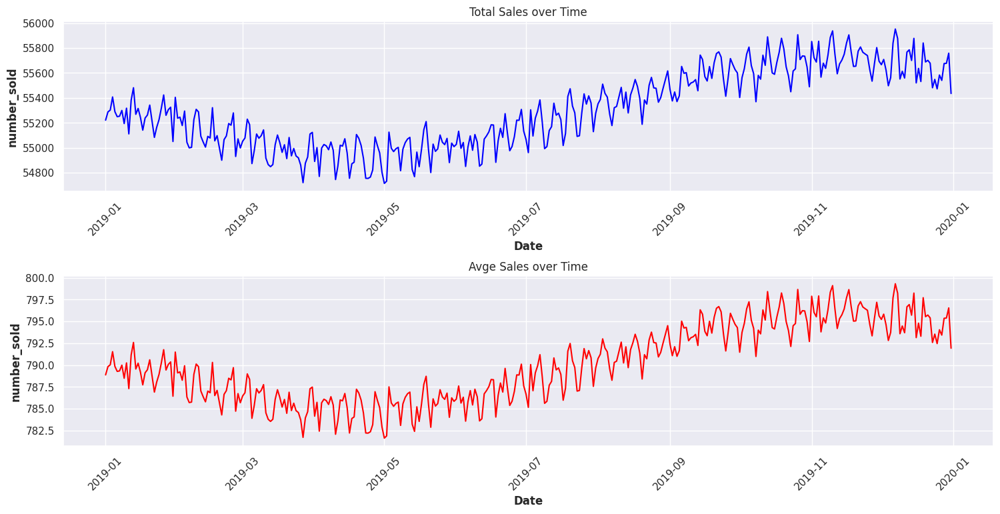

In [14]:
#Total sales over the time per year
total_sales=test.groupby([test.Date])['number_sold'].sum().reset_index()
avge_sales=test.groupby([test.Date])['number_sold'].mean().reset_index()
plt.subplot(2, 1, 1)
plt.title('Total Sales over Time')
sns.set(rc={'figure.figsize':(18,8.27)})
s=sns.lineplot(x=total_sales.Date,y=total_sales.number_sold,color='blue')
# Rotate x-axis labels for better readability
s.set_xticklabels(s.get_xticklabels(), rotation=45)
plt. subplots_adjust(wspace=0.2,hspace=0.5) 

plt.subplot(2, 1, 2)
plt.title('Avge Sales over Time')
sns.set(rc={'figure.figsize':(18,8.27)})
s1=sns.lineplot(x=avge_sales.Date,y=avge_sales.number_sold,color='red')
s1.set_xticklabels(s.get_xticklabels(), rotation=45)
plt.savefig('./DistributionData.jpg')
plt.show()

In [9]:
skewness = total_sales['number_sold'].skew()

def check_skeness(feature,name):
    value=feature.skew()
    if value>1:
        print('Highly positive skewed',value,name)
    elif value<-1:
        print('Highly negative skewed',value,name)
    elif -0.5<=value<=0.5:
        print('Normal distribution',value,name)
    elif 0.5<value<1:
        print('Moderate positive skewed',value,name)
    elif -1<value<-0.5:
        print('Moderate negative skewed',value,name)
        
check_skeness(total_sales['number_sold'],'number_sold')

Normal distribution 0.1532101768768885 number_sold


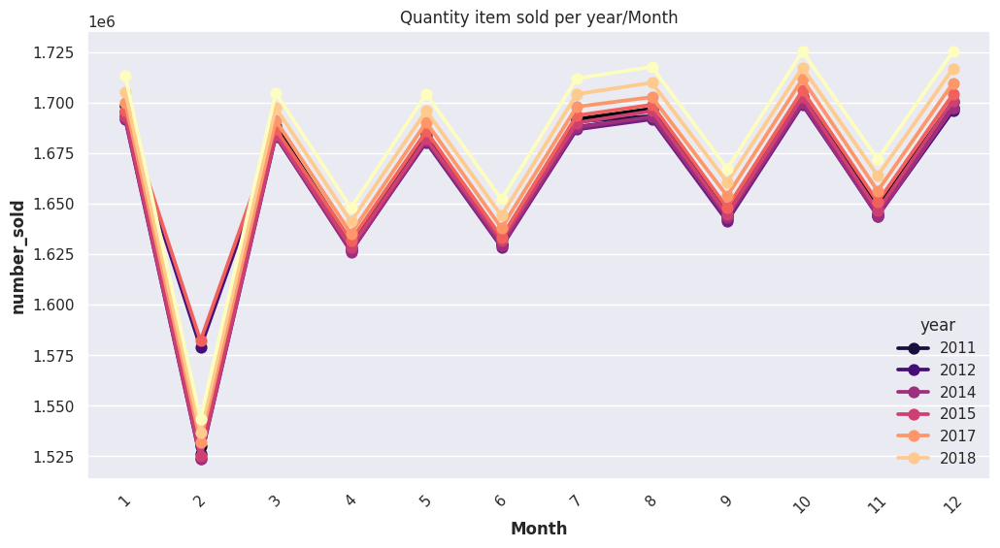

In [10]:
#We are going to plot the quantity sold each month for the different years.
grouped=train_test.groupby([train_test.year,train_test.Month])['number_sold'].sum().reset_index()

plt.figure(figsize=(12, 6))
s=sns.pointplot(x='Month',y='number_sold',hue='year',data=grouped,palette='magma')
s.set_title('Quantity item sold per year/Month')
# Rotate x-axis labels for better readability
s.set_xticklabels(s.get_xticklabels(), rotation=45)
plt.savefig('./QuantityItemSoldYearMonth.jpg')
plt.show()

# Data Darts
I will use Data Darts librarys to make the comparison between the all models performance. I need to transform the dataframe to a data darts structure.There are differents ways to organise. I have tried 3 differents options,getting the best results with the first option.

* Create one darts time series per store. I will have a list of 10 TS where each TS is group by product.

* Group the data by store and product. In total, I will have 70 time series (7 unique stores*10 unique products) of length 3287 for the train and 365 length for test.The number sold will be our target to predict. (See in another notebook)
    
* Create one darts time series per product. I will have a list of 7 TS where each TS is group per store. (See in another notebook)

In [15]:
stores=train.store.unique()
products=train['product'].unique()

lst_products_ts={}

for i in range (0, len(products)):
    
    train_product=train[train['product']==i]
    list_ts_product= TimeSeries.from_group_dataframe(train_product, 
                                time_col="Date",
                                group_cols=['product','store'],
                                #static_cols=['store'],#columns does not change
                                value_cols="number_sold",#target feature to predict
                                fill_missing_dates=True, 
                                freq='D')
    
    for ts in list_ts_product:
            ts = ts.astype(np.float32)

    list_ts_product = sorted(list_ts_product, key=lambda ts: int(ts.static_covariates_values()[0,0]))
    #Sort the list of family time series based on the store number.
    
    lst_products_ts[i]=list_ts_product

print('Number of products as list of ts:',len(lst_products_ts))
print('Each product from the list of ts has:',len(lst_products_ts[0]))
print('Each ts #samples:',len(lst_products_ts[0][1]))

Number of products as list of ts: 10
Each product from the list of ts has: 7
Each ts #samples: 3287


In [16]:
# Normalize the data before applying to the model
lst_train_pipeline_product={}
lst_ts_transformed_product={}

for key in lst_products_ts:
    
    #Filling the missing values name=Name of the transformer
    train_filler = MissingValuesFiller(verbose=False, n_jobs=-1, name="Fill NAs")
    
    # This method encode the staticCovariates features only and uses OneHotEncoder.
    static_cov_transformer = StaticCovariatesTransformer(verbose=False, transformer_cat = sklearn.preprocessing.OneHotEncoder(), name="Encoder")
    
    #This method apply a function and the inverse too if specify. It is similar to the map.
    log_transformer = InvertibleMapper(np.log1p, np.expm1, verbose=False, n_jobs=-1, name="Log-Transform") 
    
    #This method just create a pipeline ( all in order)
    train_pipeline = Pipeline([train_filler,
                             static_cov_transformer,
                             log_transformer])

    #Fit all the transformers in the pipeline and transform the data
    training_transformed_product = train_pipeline.fit_transform(lst_products_ts[key])
    
    lst_train_pipeline_product[key]=train_pipeline
    lst_ts_transformed_product[key]=training_transformed_product


In [17]:
len(lst_ts_transformed_product),len(lst_ts_transformed_product[0]),len(lst_ts_transformed_product[0][1])

(10, 7, 3287)

# Models: LGBM,Tide, Nhits,TSMixer,N-Beats,TFT transformers

I define a generic for training a model depending on a list of models with the names. I save the model trained and have another function to load the models once I have trained them. I have used tensorboard to see based on the epochs if the model has a better accuracy.
If you would like to train a specific model, then you need to do the following changes:

* change log_dir and work_dir to your local directories.
* Uncomment the model creation i.e #model_tide=TiDEModel(**T..) with the models you would like to be trained and model list (models={})
* Uncomment the line train_models(models) if you would like to train the models.

After you have trained the models and saved in your local directory. You can load them to compare accuracies.To do that, you should follow these steps:

*  Comment the model creation ie. #model_tide=TiDEModel(**T..) with the models you would like to be trained and model list (models={}). 
*  Uncomment the line models_loaded={ } to load models.
*  Comment the line train_models(models) for load models.
*  Uncomment the line models=load_models(models_loaded)

I create a dataframe list with the prediction value for number_sold and the value of the test data. The list is used to compare accuracy and visualize results.

In [63]:
# Set up the TensorBoard logging callback
log_dir = '/home/maarten/logs'  # Directory to store logs
logger = TensorBoardLogger(save_dir=log_dir)


pl_trainer_kwargs ={"accelerator": "gpu", 
                    "devices": [1],
                     "logger":logger
                   }
# learning rate scheduler
lr_scheduler_cls = torch.optim.lr_scheduler.ExponentialLR
lr_scheduler_kwargs = {"gamma": 0.999}

LGBM_params={'lags':365,
            'random_state':2022,
            'gpu_use_dp':True, 
             'show_warning':False
        }

TiDE_params = {
    "input_chunk_length":365 , # number of days to lookback 
    "output_chunk_length":365, #
    "num_encoder_layers": 1,
    "num_decoder_layers": 1,
    "decoder_output_dim": 16,
    "hidden_size": 128,
    "temporal_width_past": 4,
    "temporal_width_future": 4,
    "temporal_decoder_hidden": 32,
    "dropout": 0.1,
    "batch_size": 32,
    "n_epochs": 30,
    "random_state": 42,
    "use_static_covariates": True,
    "optimizer_kwargs": {"lr": 1e-3},
    "use_reversible_instance_norm": True,
     "save_checkpoints":True,
    "log_tensorboard":True
    }

Nhits_params = {
    "input_chunk_length": 365, # number of months to lookback
    "output_chunk_length":365,
    "num_blocks": 1,
    "num_layers": 2,
    "layer_widths": 512,
    "loss_fn": torch.nn.L1Loss(),
    "dropout": 0.1,
    "n_epochs": 40,
    "random_state": 42,
    "optimizer_kwargs": {"lr": 1e-3},
     "save_checkpoints":True,
    'pl_trainer_kwargs':pl_trainer_kwargs,
    "log_tensorboard":True
    }

TSMixer_params={"input_chunk_length": 365, # number of months to lookback
            "output_chunk_length":365,
            "num_blocks":2,
            "hidden_size": 128,
            "ff_size": 64,
            "dropout": 0.1,
            "n_epochs":20,
            'normalize_before':True,
            "use_static_covariates": True,
            "loss_fn": torch.nn.L1Loss(),
            "optimizer_kwargs": {"lr": 1e-3},
            "random_state": 42,
            "save_checkpoints":True,
            "norm_type": 'LayerNorm',
            "lr_scheduler_cls": lr_scheduler_cls,
            "lr_scheduler_kwargs": lr_scheduler_kwargs,
            "log_tensorboard":True,
            'pl_trainer_kwargs':pl_trainer_kwargs
             }

NBeats_params={"input_chunk_length":365,
               "output_chunk_length":365,
               "output_chunk_shift":0, 
               "generic_architecture":True, 
               'num_stacks':30, #(only with generic_architecture=True because otherwise num_stacks=2 trend and seasonality)
               "num_blocks":1, 
               "num_layers":4, 
               "layer_widths":512, 
               "expansion_coefficient_dim":5, #(only with generic_architecture=True)
               #"trend_polynomial_degree":2, #(only use with generic_architecture=False)
               "dropout":0.1, 
               'batch_size':32,
               "activation":'ReLU',
               "loss_fn": torch.nn.L1Loss(),
                "optimizer_kwargs": {"lr": 1e-3},
               "random_state":42,
               "n_epochs": 20,
               "save_checkpoints":True,
               "log_tensorboard":True,
               'pl_trainer_kwargs':pl_trainer_kwargs
              }

TFT_params={"input_chunk_length":365,
               "output_chunk_length":365,
               "output_chunk_shift":0, 
               "hidden_size":64, #Important parameter to tune
               'lstm_layers':1, 
               "num_attention_heads":4, 
              # "full_attention":False, #Only attention to the previous, if true, attention to the previous,current and future 
               #"feed_forward":'GatedResidualNetwork', #Type of activation (“GLU”, “Bilinear”, “ReGLU”, “GEGLU”, “SwiGLU”, “ReLU”, “GELU”)
               "dropout":0.1, 
               #"hidden_continuous_size":8, #Default value
                "add_relative_index":True, #Need future covariates to work. So it generates automatically them.
                "norm_type":'LayerNorm',# Type of different LayerNorm (“LayerNorm”, “RMSNorm”, “LayerNormNoBias”)
                #"use_static_covariates":False, #Wether you use static covariates or not
                "batch_size":32,
               "loss_fn": torch.nn.L1Loss(),
                "optimizer_kwargs": {"lr": 1e-3},
               "random_state":42,
               "n_epochs": 20,
               "save_checkpoints":True,
               "log_tensorboard":True,
               'pl_trainer_kwargs':pl_trainer_kwargs
              }

#Working directory to save the trained models.
work_dir='/ai/jupyter/Esther/Models/'

#Define the models and a dictionary

#LGBM_model=LightGBMModel(**LGBM_params)
#TiDE_model = TiDEModel(**TiDE_params,work_dir=work_dir)
#Nhits_model = NHiTSModel(**Nhits_params,work_dir=work_dir)
#TSMixer_model=TSMixerModel(**TSMixer_params,work_dir=work_dir)
#NBeats_model=NBEATSModel(**NBeats_params,work_dir=work_dir)
#TFT_model=TFTModel(**TFT_params,work_dir=work_dir)

#models={#'LGBM':LGBM_model,
       #'TiDE':TiDE_model
       #'Nhits':Nhits_model,
 #       'TSMixer':TSMixer_model,
 #       'NBEATS':NBeats_model,
  #      'TFT':TFT_model
 #    }

model_list_ts={}

def train_models(model_list): 
    
    for name,model in tqdm(model_list.items()):
        
        model_list_ts={}
        for i in tqdm(range(0,len(lst_ts_transformed_product))):

                model.model_name=name+'_product_'+str(i)
                #Create the directory to store the trained model.
                os.mkdir(model.model_name)
                model_file_path = os.path.join(work_dir+model.model_name, 'model.pth')
                model.fit(series=lst_ts_transformed_product[i]) 
                model.save(model_file_path)
                model_list_ts[i]=model
                
        models[name]=model_list_ts
    
    return model_list_ts

models_loaded={'TiDE':'TiDE',
              'Nhits':'Nhits',
              'TSMixer':'TSMixer',
            'LGBM':'LGBM',
            'NBEATS':'NBEATS',
        'TFT':'TFT'
            }

def loaded_model(model_dict):
    
   
    models={}
    for name in tqdm(model_dict):
        
        model_list_ts={}
        for i in tqdm(range(0,len(lst_ts_transformed_product))):
            
                model_name=name+'_product_'+str(i)

                model_file_path = os.path.join(work_dir+model_name, 'model.pth')  
                if (name=='Nhits'):
                    model_list_ts[i] = NHiTSModel.load(model_file_path)
                elif (name=='TiDE'):
                    model_list_ts[i] = TiDEModel.load(model_file_path)
                elif (name=='TSMixer'):
                    model_list_ts[i] = TSMixerModel.load(model_file_path)
                elif (name=='LGBM'):
                    model_list_ts[i]=LightGBMModel.load(model_file_path)
                elif (name=='NBEATS'):
                    model_list_ts[i]=NBEATSModel.load(model_file_path)
                elif (name=='TFT'):
                    model_list_ts[i]=TFTModel.load(model_file_path)
            
        models[name]=model_list_ts
    return models

models=loaded_model(models_loaded)

#model_list_ts=train_models(models)



100%|██████████| 10/10 [00:00<00:00, 366.69it/s]

100%|██████████| 6/6 [00:19<00:00,  3.22s/it]


In [64]:
#Predict

models_forecast=[]

def forecast_models(model_dict):
    
    models_forecast={}

    for name in tqdm(model_dict):
        
        forecast_list_product=[]
        model_list=model_dict[name]
        for i in tqdm(range (0, len(model_list))):
            forecast_product=model_list[i].predict(#Number of time steps to predict after the last value of training data.
                                     n=365,
                                     #Series used to predict the test data.Basically the training.
                                    series=lst_ts_transformed_product[i])
            forecast_list_product.append(forecast_product)
            
        models_forecast[name]=forecast_list_product
        
    return models_forecast

models_forecast=forecast_models(models)

  0%|          | 0/10 [00:00<?, ?it/s]Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 36.90it/s]


 10%|█         | 1/10 [00:00<00:01,  7.00it/s]Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 41.27it/s]


 20%|██        | 2/10 [00:00<00:01,  7.10it/s]Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 47.73it/s]

Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 47.08it/s]



 40%|████      | 4/10 [00:00<00:00,  8.90it/s]Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 47.03it/s]


Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 48.59it/s]

 60%|██████    | 6/10 [00:00<00:00,  9.63it/s]Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 54.74it/s]

Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 57.03it/s]



 80%|████████  | 8/10 [00:00<00:00, 10.33it/s]Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 51.15it/s]


Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 58.51it/s]


 17%|█▋        | 1/6 [00:01<00:05,  1.01s/it]


  0%|          | 0/10 [00:00<?, ?it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 59.15it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 60.95it/s]


 20%|██        | 2/10 [00:00<00:00, 14.58it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 60.32it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 56.49it/s]


 40%|████      | 4/10 [00:00<00:00, 14.61it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 58.87it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 59.14it/s]


 60%|██████    | 6/10 [00:00<00:00, 14.67it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 60.17it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 60.29it/s]



 80%|████████  | 8/10 [00:00<00:00, 14.74it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 60.39it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 57.07it/s]



  0%|          | 0/10 [00:00<?, ?it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 55.29it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 53.98it/s]



 20%|██        | 2/10 [00:00<00:00, 12.10it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 56.02it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 56.64it/s]


 40%|████      | 4/10 [00:00<00:00, 12.18it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 56.53it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 53.33it/s]


 60%|██████    | 6/10 [00:00<00:00, 12.20it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 54.60it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 53.28it/s]



 80%|████████  | 8/10 [00:00<00:00, 12.03it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 55.60it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 55.26it/s]



  0%|          | 0/10 [00:00<?, ?it/s]

[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_w


 10%|█         | 1/10 [00:00<00:04,  2.16it/s]

[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_w


 20%|██        | 2/10 [00:01<00:06,  1.17it/s]

[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_w


 30%|███       | 3/10 [00:02<00:04,  1.53it/s]

[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_w


 40%|████      | 4/10 [00:02<00:03,  1.79it/s]

[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_w


 50%|█████     | 5/10 [00:02<00:02,  2.03it/s]

[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_w


 60%|██████    | 6/10 [00:03<00:01,  2.19it/s]

[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_w

[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_w


 70%|███████   | 7/10 [00:03<00:01,  2.31it/s]

[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_w


 80%|████████  | 8/10 [00:03<00:00,  2.41it/s]

[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_w


 90%|█████████ | 9/10 [00:04<00:00,  2.48it/s]

[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_w


 67%|██████▋   | 4/6 [00:07<00:04,  2.36s/it]

[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_warning
[LightGBM] [Warning] Unknown parameter: show_w


  0%|          | 0/10 [00:00<?, ?it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 33.11it/s]


 10%|█         | 1/10 [00:00<00:03,  2.80it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 33.33it/s]


 20%|██        | 2/10 [00:00<00:02,  3.09it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 32.32it/s]


 30%|███       | 3/10 [00:00<00:02,  3.09it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 31.04it/s]


 40%|████      | 4/10 [00:01<00:01,  3.21it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 31.91it/s]


 50%|█████     | 5/10 [00:01<00:01,  2.87it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 31.95it/s]


 60%|██████    | 6/10 [00:01<00:01,  3.11it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 31.42it/s]


 70%|███████   | 7/10 [00:02<00:00,  3.25it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 32.08it/s]


 80%|████████  | 8/10 [00:02<00:00,  3.18it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 31.88it/s]


 90%|█████████ | 9/10 [00:02<00:00,  3.25it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 30.59it/s]


 83%|████████▎ | 5/6 [00:10<00:02,  2.64s/it]


  0%|          | 0/10 [00:00<?, ?it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 29.99it/s]



 10%|█         | 1/10 [00:00<00:00,  9.29it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 29.83it/s]


 20%|██        | 2/10 [00:00<00:00,  9.36it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 30.06it/s]


 30%|███       | 3/10 [00:00<00:00,  9.35it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 30.12it/s]


 40%|████      | 4/10 [00:00<00:00,  9.36it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 29.79it/s]


 50%|█████     | 5/10 [00:00<00:00,  9.34it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 28.51it/s]


 60%|██████    | 6/10 [00:00<00:00,  9.28it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 29.78it/s]


 70%|███████   | 7/10 [00:00<00:00,  9.29it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 29.74it/s]


 80%|████████  | 8/10 [00:00<00:00,  9.31it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 30.16it/s]


 90%|█████████ | 9/10 [00:00<00:00,  9.31it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 30.10it/s]


100%|██████████| 6/6 [00:11<00:00,  1.91s/it]

In [65]:
def inverse_forecast(forecast_list):
    
    inverse_forecast_product=[]

    for i in range (0,len(forecast_list)):
    
        inverse_forecast=lst_train_pipeline_product[i].inverse_transform(forecast_list[i],partial='False')
    
        inverse_forecast_product.append(inverse_forecast)
        
    return inverse_forecast_product

def predict_to_dataframe(forecast_list):
    
    list_of_ts=[]
    
    for i in range (0,len(products)):
        for j in range (0,len(stores)):
            
            forecast_one_ts=forecast_list[i][j].pd_dataframe()
            forecast_one_ts.columns=['fcast']
            forecast_one_ts['store']=j
            forecast_one_ts['product']=i
            list_of_ts.append(forecast_one_ts)     
        
    df_forecast=pd.concat(list_of_ts)
        
    return df_forecast

df_prediction_list={}

def df_prediction_models(fcast_list):
    
     for key, fcast in tqdm(fcast_list.items()):
        
        inv_fcast=inverse_forecast(fcast)
        df_fcast=predict_to_dataframe(inv_fcast)
        df_fcast.reset_index(drop=False,inplace=True)
        df_pred_fcast=test.merge(df_fcast,on=['Date','store','product'])
        df_prediction_list[key]=df_pred_fcast
    
     return 

df_prediction_models(models_forecast)

100%|██████████| 6/6 [00:06<00:00,  1.08s/it]


In [66]:
df_prediction_list

{'TiDE':          Date     store  product  number_sold     fcast  
 0     2019-01-01    0       0         845      843.863227
 1     2019-01-02    0       0         851      842.851398
 2     2019-01-03    0       0         840      844.402006
 3     2019-01-04    0       0         842      842.318353
 4     2019-01-05    0       0         845      844.754701
 ...          ...    ...      ...          ...         ...
 25545 2019-12-27    6       9         901      904.387783
 25546 2019-12-28    6       9         926      910.160034
 25547 2019-12-29    6       9         913      903.683721
 25548 2019-12-30    6       9         899      899.401700
 25549 2019-12-31    6       9         886      888.943990
 
 [25550 rows x 5 columns],
 'Nhits':          Date     store  product  number_sold     fcast  
 0     2019-01-01    0       0         845      842.377008
 1     2019-01-02    0       0         851      840.870363
 2     2019-01-03    0       0         840      840.458831
 3     201

# Visualize Prediction
Create several plots to compare prediction:
* Total sales
* Group by date
* Group by store: Allow us to see what store is better predicted.
* Group by product. Alow us to see what product is better predicted.

In [67]:
#List of dataframes Prediction
list_keys=df_prediction_list.keys()
n_rows=len(list_keys)
n_rows

6

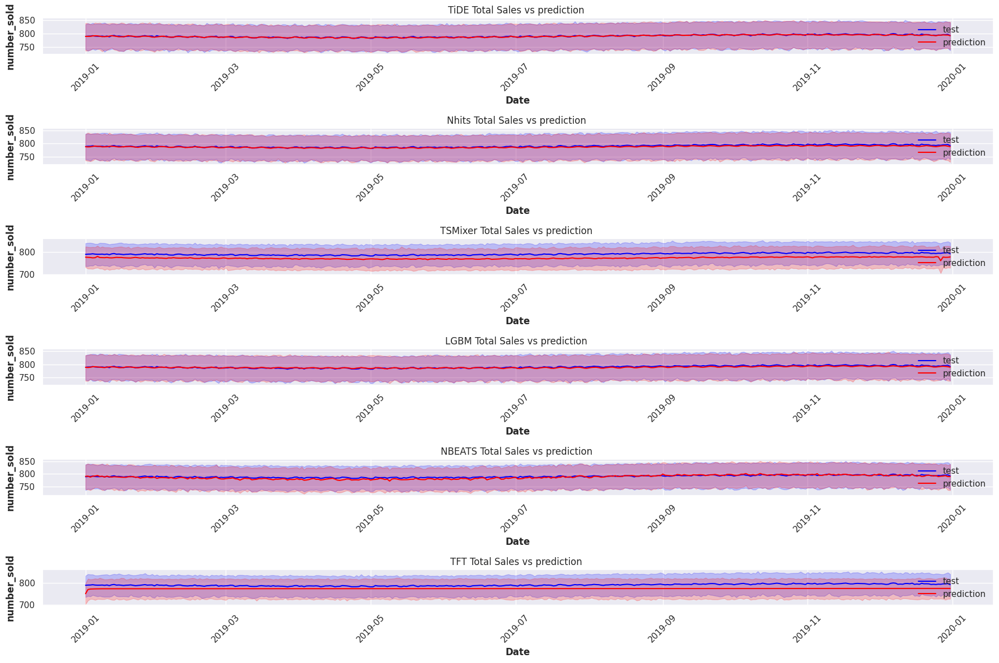

In [68]:
def plot_prediction(df_list):
    
    fig, axes = plt.subplots(nrows=n_rows,figsize=(18, 12))
    count=0
    for key in list_keys:
        axes[count].set_title(key+' Total Sales vs prediction ')
        s=sns.lineplot(x=df_list[key].Date,y=df_list[key].number_sold,color='blue',label='test',ax=axes[count])
        s.set_xticklabels(s.get_xticklabels(), rotation=45)
        s1=sns.lineplot(x=df_list[key].Date,y=df_list[key].fcast,color='red',label='prediction',ax=axes[count])
        s1.set_xticklabels(s.get_xticklabels(), rotation=45)
        count=count+1
        
    plt. subplots_adjust(wspace=0.2,hspace=0.5)
    plt.tight_layout()
    plt.show()
    fig.savefig('./prediction.jpg')    

    return

plot_prediction(df_prediction_list)

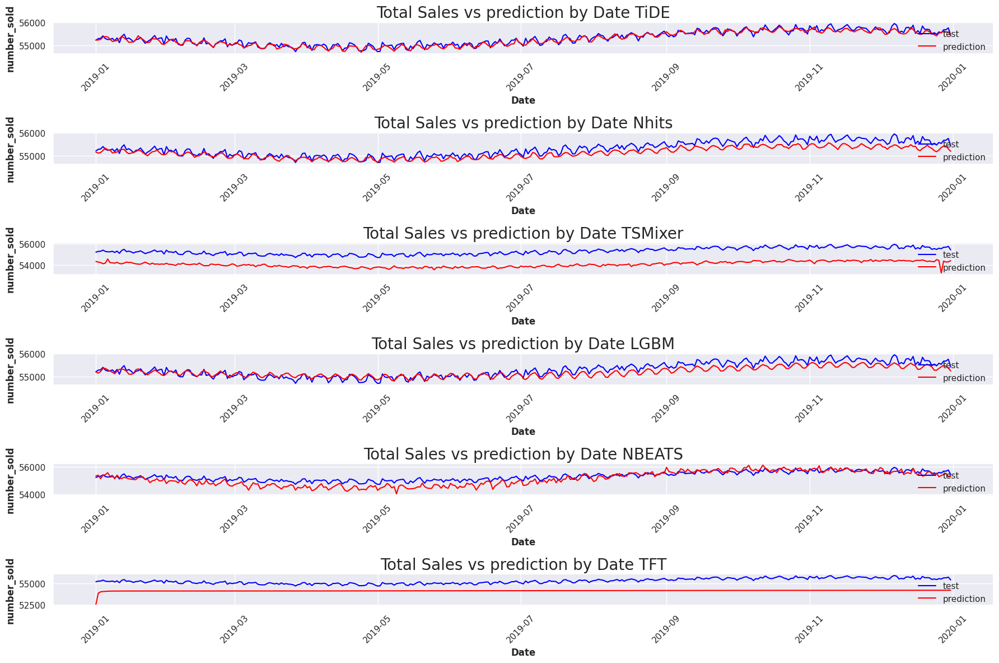

In [69]:
#Plot the prediction vs the real value by date
def plot_prediction_by_date(df_list):
    
    fig, axes = plt.subplots(nrows=n_rows,figsize=(18, 12))
    count=0
    total_sales_list={}
    total_sales_fcast_list={}
    
    for key in list_keys:
        
        total_sales=df_list[key].groupby([df_list[key].Date])['number_sold'].sum().reset_index()
        total_sales_forecast=df_list[key].groupby([df_list[key].Date])['fcast'].sum().reset_index()
        total_sales_by_date=total_sales.merge(total_sales_forecast,on=['Date'])
        axes[count].set_title('Total Sales vs prediction by Date '+ key,fontsize=20)
        s=sns.lineplot(x=total_sales.Date,y=total_sales.number_sold,color='blue',label='test',ax=axes[count])
        s.set_xticklabels(s.get_xticklabels(), rotation=45)
        s1=sns.lineplot(x=total_sales_forecast.Date,y=total_sales_forecast.fcast,color='red',label='prediction',ax=axes[count])
        s1.set_xticklabels(s.get_xticklabels(), rotation=45)
        count=count+1
        total_sales_list[key]=total_sales_by_date
     
    plt. subplots_adjust(wspace=0.2,hspace=0.5)
    plt.tight_layout()
    plt.show()
    fig.savefig('./predictionbydate.jpg')
    return total_sales_list


total_sales_by_date=plot_prediction_by_date(df_prediction_list)

In [70]:
#Plot the prediction vs the real value per store
 
def plot_prediction_by_store(df_list):
    
    fig, axes = plt.subplots(nrows=7,ncols=n_rows,figsize=(24, 24),dpi=300)
    count=0
    total_store_list={}
    total_store_fcast_list={}
    for key in list_keys:
        df=df_list[key]
        for i in range(0,len(stores)):
            df_store=df[df.store==i]
            total_per_store=df_store.groupby([df_store.Date])['number_sold'].sum().reset_index()
            total_per_store_forecast=df_store.groupby([df_store.Date])['fcast'].sum().reset_index()
            total_store=total_per_store.merge(total_per_store_forecast,on=['Date'])
            axes[i,count].set_title('Store '+str(i)+' '+key,fontsize=20)
            
            s=sns.lineplot(x=total_per_store.Date,y=total_per_store.number_sold,color='blue',label='test',ax=axes[i,count])
            s.set_xticklabels(s.get_xticklabels(), rotation=45)
            s1=sns.lineplot(x=total_per_store_forecast.Date,y=total_per_store_forecast.fcast,color='red',
                         label='prediction',ax=axes[i,count])
            s1.set_xticklabels(s.get_xticklabels(), rotation=45)
        
        count=count+1
        total_store_list[key]=total_store
    
    plt. subplots_adjust(wspace=0.2,hspace=0.5)    
    plt.tight_layout()
    plt.show()
    fig.savefig('./predictionstore.jpg')
    
    return total_store_list

total_store_list=plot_prediction_by_store(df_prediction_list)

In [71]:
#Plot the prediction vs the real value per store
 
def plot_prediction_by_product(df_list):
    
    fig, axes = plt.subplots(nrows=len(products),ncols=n_rows,figsize=(24, 24),dpi=300)
    count=0
    total_product_list={}
    total_product_fcast_list={}

    for key in list_keys:
        
        df=df_list[key]
        
        for i in range(0,len(products)):
        
            df_product=df[df['product']==i]
            total_per_product=df_product.groupby([df_product.Date])['number_sold'].sum().reset_index()
            total_per_product_forecast=df_product.groupby([df_product.Date])['fcast'].sum().reset_index()
            total_product=total_per_product.merge(total_per_product_forecast,on=['Date'])
            axes[i,count].set_title('Product '+str(i)+' '+key,fontsize=20)

            s=sns.lineplot(x=total_per_product.Date,y=total_per_product.number_sold,color='blue',label='test',ax=axes[i,count])
            s.set_xticklabels(s.get_xticklabels(), rotation=45)
            s1=sns.lineplot(x=total_per_product_forecast.Date,y=total_per_product_forecast.fcast,color='red',
                         label='prediction',ax=axes[i,count])
            s1.set_xticklabels(s.get_xticklabels(), rotation=45)
        
        count=count+1
        total_product_list[key]=total_product
    
    plt. subplots_adjust(wspace=0.2,hspace=0.5) 
    plt.tight_layout()
    plt.show()
    fig.savefig('./predictionbyproduct.jpg')
    
    return total_product_list

total_product_list=plot_prediction_by_product(df_prediction_list)

# Calculate Precision (MAE)

In [72]:
# Calculate MAPE
def mape_test(y_true,y_predict):
    return mean_absolute_percentage_error(y_true,y_predict)

def calculate_metric(df_list):
    
    mape_list={}
    rmse_list={}
    
    for key in list_keys:
        
        total_mape=round(mape_test(df_list[key].number_sold,df_list[key].fcast)*100,2)
        mape_list[key]=total_mape
        
    return mape_list


def metric_table(metric_list,name):
    
    metric=pd.DataFrame(metric_list.items(),columns=['Model',name])
    metric.set_index('Model',inplace=True)
    
    return metric

def comparison_table(metric_list):
    
    comparison_table=pd.DataFrame()
    for name, metric_lst in tqdm(metric_list.items()):
        
        df_metric=metric_table(metric_lst,name)
        #Merge all tables
        comparison_table=pd.concat([comparison_table,df_metric],axis=1)

    return comparison_table

mape_list={}


mape_list['MAPE']=calculate_metric(df_prediction_list)
mape_list['Total Mape by Date %']=calculate_metric(total_sales_by_date)
mape_list['Total Mape by Store %']=calculate_metric(total_store_list)
mape_list['Total Mape by Product %']=calculate_metric(total_product_list)  

comparison_table_mape=comparison_table(mape_list)
comparison_table_mape
                         

100%|██████████| 4/4 [00:00<00:00, 834.44it/s]


,MAPE,Total Mape by Date %,Total Mape by Store %,Total Mape by Product %
Model,,,,
TiDE,1.75,0.14,0.35,0.52
Nhits,2.15,0.32,0.33,1.40
TSMixer,4.51,2.21,1.36,1.30
LGBM,2.39,0.27,0.45,0.61
NBEATS,2.38,0.46,0.47,1.22
TFT,6.33,2.07,1.28,2.56


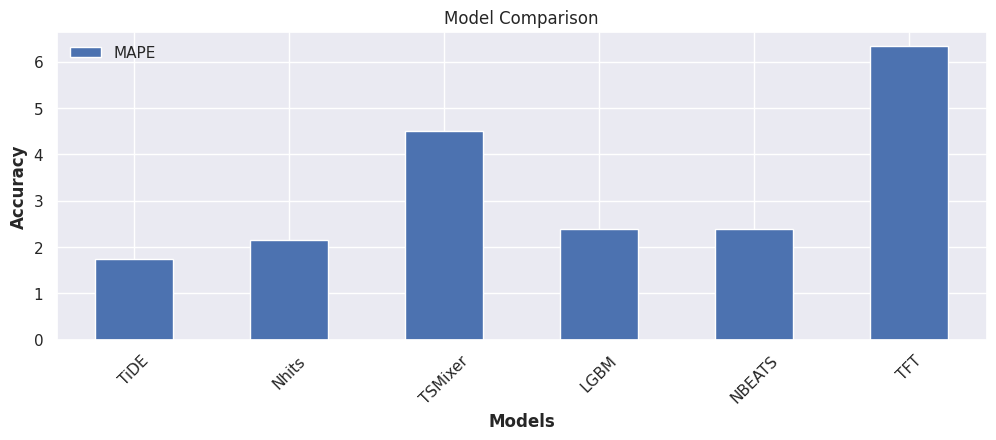

In [73]:
#Plot a bar chart for MAPE
df_metrics=pd.DataFrame({'MAPE':comparison_table_mape.MAPE.values},
                        index=comparison_table_mape.index)

df_metrics.plot.bar(figsize=(12, 4))
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Comparison')
plt.xticks(rotation=45)
plt.show()